# GDAA2010 Project One: Regression Analysis
### By Mira Rayson
### 04/02/2024

## 1. Project Introduction and Problem Definition

The purpose of this project is to predict the dissemination areas of Nova Scotia's average household operation expenditures. The chosen predictor variables encompass a diverse range of socio-economic factors, reflecting various aspects of household dynamics and community demographics. These variables were selected to capture key dimensions that may influence household operation expenditure such as but not limited to child care, household cleaning supplies, and internet services - as defined by ArcGIS Pro's Business Analyst - and to shed light on patterns within Nova Scotia's dissemination areas. These variables collectively offer valuable and dimensional insight into the socio-economic landscape, enabling the development of predictive models to inform decision-making processes and resource allocation strategies effectively. 


## 2. Data Collection and Preprocessing

### I. Data Description

The target variable for this project is Average Household Operation Expenditure (Avg_HHSpend). 

Predictor variables include household median income, average age and size; average number of owned versus rented households, counts of unemployed populations, and counts of those who hold university degrees; as well as average household spending on healthcare, charity, public transportation, and gambling.

This dataset was generated using Business Analyst in ArcGIS Pro.


### II. Data Preprocessing

In [1]:
# importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import boxcox
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet



# Importing, exploring, and visualizing data
df = pd.read_csv('NS_DAs_Enriched.csv')
column_names = df.columns.tolist()
print(column_names)
print(df.head())

# Renaming columns for greater readability and understanding
df.rename(columns={'ECYPTAPOP':'Count_Pop', 
              'HouseholdIncomeCurrentYear_ECYHNIMED':'Med_Income', 
              'FiveYearPopulationTotals_ECYPTAMED':'Med_Age',
              'HouseholdOperation_HSHO001_A':'Avg_HHSpend', 
              'HealthPersonalCare_HSHC001_A':'Avg_Healthcare', 
              'EducationalAttainment_ECYEDUUD':'Count_WithDegree', 
              'SizeOfHousehold_ECYHSZAVG':'Avg_HHSize', 
              'LabourForce_ECYACTUEMP':'Count_Unemployed',
              'GamesOfChanceNet_HSGC010_A': 'Avg_Gambling',
              'GiftsOfMoneyAndContributions_HSMG006_A': 'Avg_Charity',
              'Transportation_HSTR050_A': 'Avg_PublicTransport',
              'Shelter_HSSH010_A': 'Avg_OwnedHH',
              'Shelter_HSSH003_A': 'Avg_RentedHH'
              }, inplace=True)

# Defining target and predictor variables
target = (df['Avg_HHSpend'])
predictors = df[['Count_Pop', 'Med_Income', 'Med_Age', 'Avg_Healthcare',
                  'Count_WithDegree', 'Avg_HHSize', 'Count_Unemployed',
                  'Avg_Gambling', 'Avg_Charity', 'Avg_PublicTransport',
                  'Avg_OwnedHH', 'Avg_RentedHH']]

# Removing unnecessary columns
to_remove = ['ID', 'OID_', 'NAME', 'RG_NAME', 'RG_ABBREV', 'HasData', 'aggregationMethod', 'HasData_1', 
             'aggregationMethod_1', 'HasData_12', 'aggregationMethod_12','Shape_Area', 'Shape_Length']
df = df.drop(to_remove, axis=1)

# Checking column names and number of rows in dataset
print(df.columns)
num_rows = df.shape[0]
print("Number of rows in the dataset:", num_rows)


['OID_', 'ID', 'NAME', 'ECYPTAPOP', 'RG_NAME', 'RG_ABBREV', 'HasData', 'aggregationMethod', 'HouseholdIncomeCurrentYear_ECYHNIMED', 'FiveYearPopulationTotals_ECYPTAMED', 'HouseholdOperation_HSHO001_A', 'HealthPersonalCare_HSHC001_A', 'EducationalAttainment_ECYEDUUD', 'SizeOfHousehold_ECYHSZAVG', 'LabourForce_ECYACTUEMP', 'HasData_1', 'aggregationMethod_1', 'GamesOfChanceNet_HSGC010_A', 'GiftsOfMoneyAndContributions_HSMG006_A', 'Transportation_HSTR050_A', 'HasData_12', 'aggregationMethod_12', 'Shelter_HSSH010_A', 'Shelter_HSSH003_A', 'Shape_Length', 'Shape_Area']
   OID_        ID          NAME  ECYPTAPOP                        RG_NAME  \
0     1  12010030  12010030, NS        392  Nova Scotia / Nouvelle-Écosse   
1     2  12010031  12010031, NS        578  Nova Scotia / Nouvelle-Écosse   
2     3  12010032  12010032, NS        410  Nova Scotia / Nouvelle-Écosse   
3     4  12010033  12010033, NS        399  Nova Scotia / Nouvelle-Écosse   
4     5  12010034  12010034, NS        389  No

In [2]:
# Removing all values less than 0.1 from dataset
df = df.loc[(df >= 0.1).all(axis=1)]

I chose this value as there were quite a few rows with values close to 0 that were being erased when I used 0 instead of 0.1. I did not want to accept the close-to-zero losses when inputting 0 as it could have potentially removed impactful samples.

   Count_Pop  Med_Income  Med_Age  Avg_HHSpend  Avg_Healthcare  \
0        392    73428.57     55.3      5330.39         6158.24   
1        578    69166.67     48.5      5270.15         6014.16   
3        399    45000.00     55.3      4054.31         4416.42   
4        389    53823.53     48.6      4345.22         4243.35   
5        498    71388.89     57.0      5404.66         6168.56   

   Count_WithDegree  Avg_HHSize  Count_Unemployed  Avg_Gambling  Avg_Charity  \
0              10.0         2.0               8.0         79.59       511.66   
1              63.0         2.0              38.0         69.60       436.69   
3             112.0         1.9               1.0         27.02       287.43   
4              18.0         2.1              33.0         41.58       352.88   
5              69.0         2.0              22.0         77.40       453.33   

   Avg_PublicTransport  Avg_OwnedHH  Avg_RentedHH  
0               493.55      4558.82       1336.04  
1               46

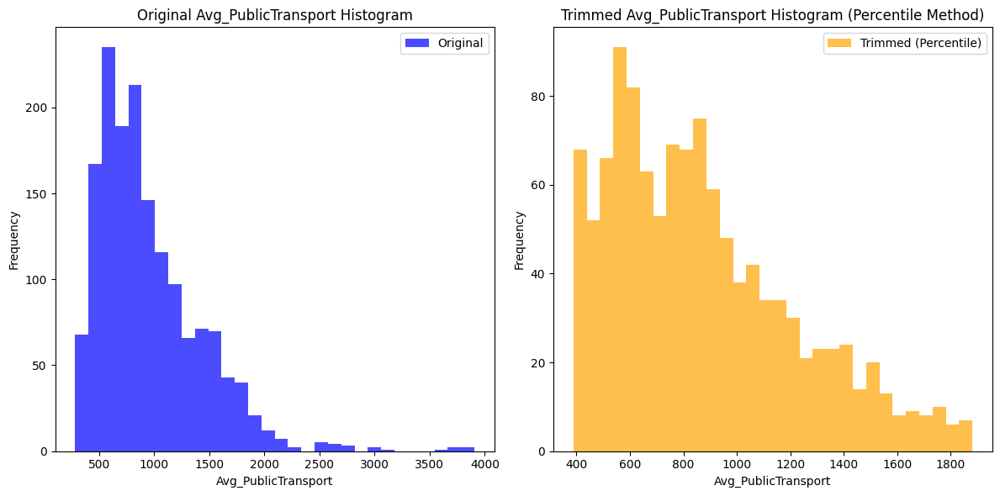

In [3]:
# Specifying the percentiles for trimming outliers
lower_percentile = 3
upper_percentile = 97

# Calculating the lower and upper percentile values for each predictor
lower_percentile_values = predictors.iloc[:, :-1].apply(lambda x: np.percentile(x.dropna(), lower_percentile))
upper_percentile_values = predictors.iloc[:, :-1].apply(lambda x: np.percentile(x.dropna(), upper_percentile))

# Identifing rows containing outliers and drop them entirely from the dataset
trimmed_df = df.copy()
for col in lower_percentile_values.index:
    is_outlier_lower = trimmed_df[col] < lower_percentile_values[col]
    is_outlier_upper = trimmed_df[col] > upper_percentile_values[col]
    outliers_index = is_outlier_lower | is_outlier_upper
    trimmed_df = trimmed_df[~outliers_index]

print(trimmed_df.head())

# Creating figure with two subplots for visualizing the difference between original vs. trimmed variables
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].hist(df['Avg_PublicTransport'], bins=30, alpha=0.7, color='blue', label='Original')
axes[0].set_title('Original Avg_PublicTransport Histogram')
axes[0].set_xlabel('Avg_PublicTransport')
axes[0].set_ylabel('Frequency')
axes[0].legend()

axes[1].hist(trimmed_df['Avg_PublicTransport'], bins=30, alpha=0.7, color='orange', label='Trimmed (Percentile)')
axes[1].set_title('Trimmed Avg_PublicTransport Histogram (Percentile Method)')
axes[1].set_xlabel('Avg_PublicTransport')
axes[1].set_ylabel('Frequency')
axes[1].legend()

plt.tight_layout()
plt.show()

I chose the Percentile Method for trimming outliers as it can handle extreme values in data, unlike the Standard Deviation or IQR methods that are more sensitive to distribution and outliers. The fixed percentage ensures that outliers are identified consistently in a way that makes the method more reliable and less prone to effects of skewed distributions and/or extreme values. I decided to only trim the very highest and lowest values (keeping 3%-97% of the data), to ensure I identified outliers without making assumptions about the underlying distribution of the data.

In [4]:
# Initializing the MinMaxScaler
scaler = MinMaxScaler()

# Selecting predictor columns and target variable from trimmed_df
predictor_data = trimmed_df[['Count_Pop', 'Med_Income', 'Med_Age', 'Avg_Healthcare',
                             'Count_WithDegree', 'Avg_HHSize', 'Count_Unemployed',
                             'Avg_Gambling', 'Avg_Charity', 'Avg_PublicTransport',
                             'Avg_OwnedHH', 'Avg_RentedHH']]
target_variable = trimmed_df['Avg_HHSpend']

# Scaling predictors and target variable together
scaled_predictors = scaler.fit_transform(predictor_data)
scaled_target_variable = scaler.fit_transform(target_variable.values.reshape(-1, 1))

# Creating a DataFrame with the scaled predictors and target
scaled_df_minmax = pd.DataFrame(scaled_predictors, columns=predictor_data.columns)
scaled_df_minmax['Avg_HHSpend'] = scaled_target_variable

print(scaled_df_minmax.head())
print(scaled_df_minmax.shape)

   Count_Pop  Med_Income   Med_Age  Avg_Healthcare  Count_WithDegree  \
0   0.128697    0.333317  0.824104        0.635438          0.004435   
1   0.277378    0.289361  0.602606        0.606081          0.121951   
2   0.134293    0.040109  0.824104        0.280533          0.230599   
3   0.126299    0.131114  0.605863        0.245269          0.022173   
4   0.213429    0.312280  0.879479        0.637541          0.135255   

   Avg_HHSize  Count_Unemployed  Avg_Gambling  Avg_Charity  \
0    0.307692          0.085366      0.471570     0.329791   
1    0.307692          0.451220      0.405903     0.251540   
2    0.230769          0.000000      0.126011     0.095746   
3    0.384615          0.390244      0.221718     0.164061   
4    0.307692          0.256098      0.457175     0.268908   

   Avg_PublicTransport  Avg_OwnedHH  Avg_RentedHH  Avg_HHSpend  
0             0.070526     0.239350      0.088665     0.324258  
1             0.053786     0.229493      0.117604     0.312340  

I chose to use MinMaxScaler for scaling operations as it preserves the shape of the original distribution of the data notably well and is beneficial when variables have slightly different scales in consistent ranges. It is also less sensitive to the presence of outliers compared to Robust Scaling and Z-Score Standardization.

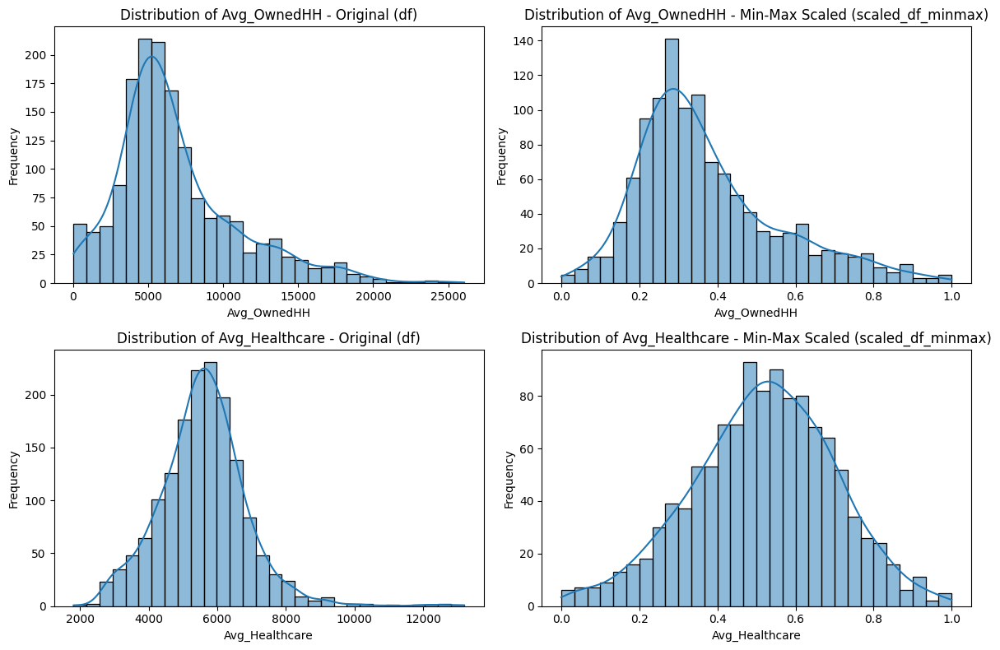

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creating grid of subplots for histograms
num_bins = 30

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Ploting histograms for variables before and after Min-Max scaling
sns.histplot(df['Avg_OwnedHH'], bins=num_bins, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Distribution of Avg_OwnedHH - Original (df)')
axes[0, 0].set_xlabel('Avg_OwnedHH')
axes[0, 0].set_ylabel('Frequency')

sns.histplot(scaled_df_minmax['Avg_OwnedHH'], bins=num_bins, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Avg_OwnedHH - Min-Max Scaled (scaled_df_minmax)')
axes[0, 1].set_xlabel('Avg_OwnedHH')
axes[0, 1].set_ylabel('Frequency')

sns.histplot(df['Avg_Healthcare'], bins=num_bins, kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Distribution of Avg_Healthcare - Original (df)')
axes[1, 0].set_xlabel('Avg_Healthcare')
axes[1, 0].set_ylabel('Frequency')

sns.histplot(scaled_df_minmax['Avg_Healthcare'], bins=num_bins, kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Distribution of Avg_Healthcare - Min-Max Scaled (scaled_df_minmax)')
axes[1, 1].set_xlabel('Avg_Healthcare')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

## 3. Exploratory Data Analytics

### I. Exploring Variable Properties and Relationships

Summary Statistics:
         Count_Pop   Med_Income      Med_Age  Avg_Healthcare  \
count  1158.000000  1158.000000  1158.000000     1158.000000   
mean      0.268458     0.350698     0.575912        0.516845   
std       0.158401     0.184841     0.218420        0.181298   
min       0.000000     0.000000     0.000000        0.000000   
25%       0.163070     0.212404     0.429967        0.400805   
50%       0.231815     0.317935     0.592834        0.525535   
75%       0.329337     0.455328     0.736156        0.641129   
max       1.000000     1.000000     1.000000        1.000000   

       Count_WithDegree   Avg_HHSize  Count_Unemployed  Avg_Gambling  \
count       1158.000000  1158.000000       1158.000000   1158.000000   
mean           0.209762     0.481998          0.341621      0.389571   
std            0.181145     0.187934          0.204535      0.226816   
min            0.000000     0.000000          0.000000      0.000000   
25%            0.086475     0.384615       

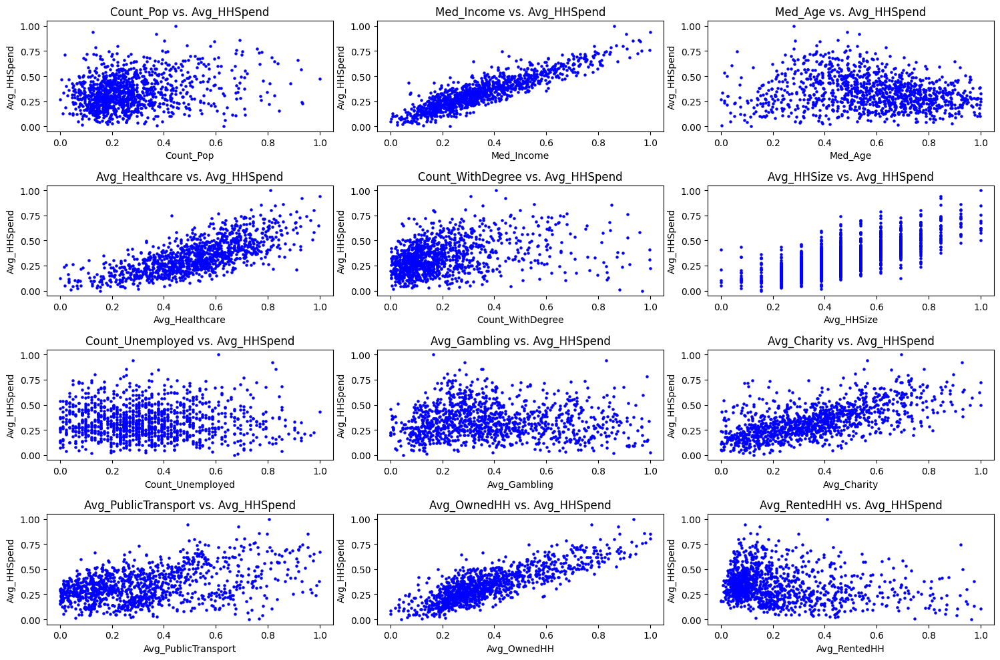

In [6]:
# Computing summary statistics for the Min-Max scaled dataframe
summary_stats = scaled_df_minmax.describe()
print("Summary Statistics:")
print(summary_stats)

# Defining predictor and target variables
predictors =  ['Count_Pop', 'Med_Income', 'Med_Age', 'Avg_Healthcare',
                'Count_WithDegree', 'Avg_HHSize', 'Count_Unemployed',
                'Avg_Gambling', 'Avg_Charity', 'Avg_PublicTransport',
                'Avg_OwnedHH', 'Avg_RentedHH']

target = ['Avg_HHSpend']

# Calculating the number of rows and columns for subplots
num_rows = int(np.ceil(len(predictors) / 3))
num_cols = min(len(predictors), 3)

# Creating subplots grid
fig, ax = plt.subplots(num_rows, num_cols, figsize=(15, 10))

if num_rows == 1:
    ax = ax.reshape(1, -1)
elif num_cols == 1:
    ax = ax.reshape(-1, 1)

# Iterating through predictor variables and create scatter plots
for i, var in enumerate(predictors):
    row = i // num_cols
    col = i % num_cols
    ax[row, col].scatter(scaled_df_minmax[var], scaled_df_minmax['Avg_HHSpend'], color='blue', s=5)
    ax[row, col].set_title(f'{var} vs. Avg_HHSpend')
    ax[row, col].set_xlabel(var)
    ax[row, col].set_ylabel('Avg_HHSpend')

# Hiding any empty subplots
for i in range(len(predictors), num_rows * num_cols):
    ax.flat[i].axis('off')

plt.tight_layout()
plt.show()

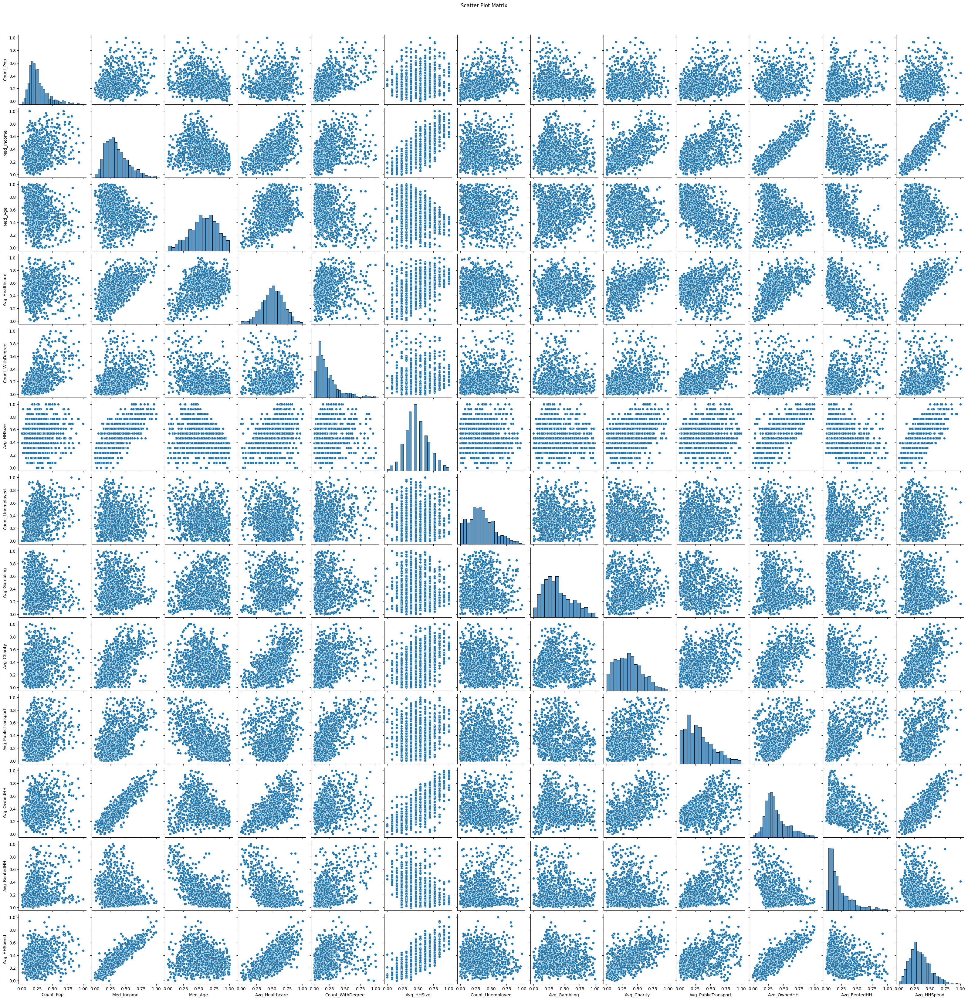

In [7]:
# Generating pairwise scatterplot matrix for all combinations of variables in the Min-Max scaled df
sns.pairplot(scaled_df_minmax)
plt.suptitle("Scatter Plot Matrix", y=1.02)
plt.show()

Correlation Coefficients:
                     Count_Pop  Med_Income   Med_Age  Avg_Healthcare  \
Count_Pop             1.000000    0.296420 -0.250642        0.108220   
Med_Income            0.296420    1.000000 -0.272549        0.573974   
Med_Age              -0.250642   -0.272549  1.000000        0.381885   
Avg_Healthcare        0.108220    0.573974  0.381885        1.000000   
Count_WithDegree      0.601203    0.409102 -0.395473        0.114825   
Avg_HHSize            0.178700    0.735217 -0.283267        0.433854   
Count_Unemployed      0.361433   -0.014726 -0.136891       -0.104685   
Avg_Gambling         -0.160350    0.000743  0.140961        0.013666   
Avg_Charity           0.189003    0.605604 -0.080357        0.555082   
Avg_PublicTransport   0.329622    0.516901 -0.563126        0.104502   
Avg_OwnedHH           0.253354    0.889728 -0.242910        0.538386   
Avg_RentedHH          0.232867   -0.106897 -0.620630       -0.499819   
Avg_HHSpend           0.261490    0.89

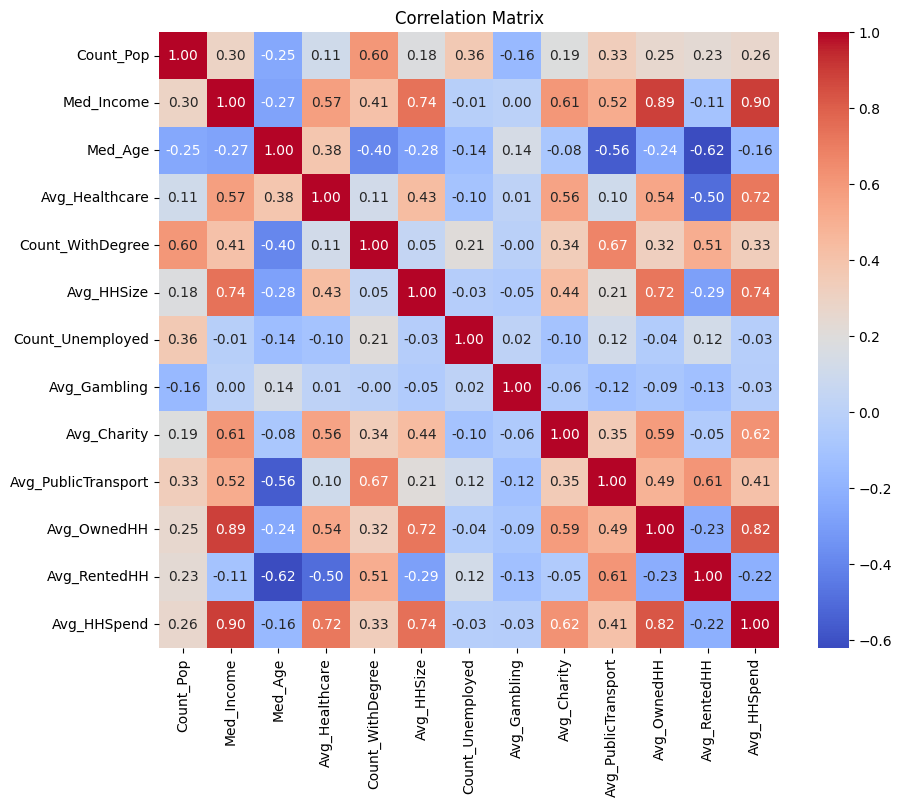

Pairs of highly correlated variables (correlation coefficient > 0.70):
('Avg_HHSpend', 'Avg_Healthcare') - Correlation Coefficient: 0.72
('Avg_OwnedHH', 'Med_Income') - Correlation Coefficient: 0.89
('Avg_HHSize', 'Med_Income') - Correlation Coefficient: 0.74
('Avg_HHSpend', 'Med_Income') - Correlation Coefficient: 0.90
('Avg_OwnedHH', 'Avg_HHSize') - Correlation Coefficient: 0.72
('Avg_HHSpend', 'Avg_OwnedHH') - Correlation Coefficient: 0.82
('Avg_HHSpend', 'Avg_HHSize') - Correlation Coefficient: 0.74


In [8]:
# Computing correlation coefficients between variables in the scaled dataframe
correlation_coefficients = scaled_df_minmax.corr()
print("Correlation Coefficients:")
print(correlation_coefficients)

# Computing correlation matrix
correlation_matrix = scaled_df_minmax.corr()

# Plotting correlation matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

# Setting threshold for high correlation
threshold = 0.70

# Finding pairs of variables with correlation greater than the threshold
highly_correlated_vars = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            var1 = correlation_matrix.columns[i]
            var2 = correlation_matrix.columns[j]
            highly_correlated_vars.add((var1, var2))

# Printing pairs of highly correlated variables
if highly_correlated_vars:
    print("Pairs of highly correlated variables (correlation coefficient > {:.2f}):".format(threshold))
    for pair in highly_correlated_vars:
        var1, var2 = pair
        PairCC = correlation_matrix.loc[var1, var2]
        print(f"{pair} - Correlation Coefficient: {PairCC:.2f}")
else:
    print("No pairs of variables exhibit high multicollinearity.")

As one can see there is a high chance of collinearity in the following predictor variables:
- ('Avg_HHSize', 'Med_Income'): 0.74
- ('Avg_OwnedHH', 'Med_Income'): 0.89
- ('Avg_OwnedHH', 'Avg_HHSize'): 0.72

These also happen to be the predictors with the greatest colinear relationships to the target variables ('Avg_HHSpend').

Early on in figuring out this project I tried removing Med_Income from the analysis at this point, to try and avoid multicollinearity and further assess the impact it would have on the project. I thought it may be beneficial in ensuring maximized stability and interpretability of the regression models, even if the variable is strongly related to the target variable. However, I did not get very far with this and started running into issues with the rest of the analysis, so I re-ran the analysis without excluding 'Med_Income' and decided to finish the rest of the analysis before going back and exploring more potential multicollinearities.

In [9]:
# Removing specified columns from the DataFrame
columns_to_remove = ['Med_Age', 'Count_Unemployed', 'Avg_Gambling']

scaled_df = scaled_df_minmax.drop(columns=columns_to_remove)

I chose to remove the median age, average spending on gambling, and count of unemployed variables as they appeared to have the least linear relationships to the target variable. I would like to note that I find it interesting age had such a neutral-negative correlation coefficient to the target variable, as one may think that household operation expenditures may fluccuate more throughout different age demographics. 

Further, I decided to keep 2 predictors with relatively neutral coefficients - population counts and average rented households - for two reasons. One, for contextual and informative considerations. And two, to examine the effect these had on the rest of the analysis.

### II. Exploring Variable Distributions

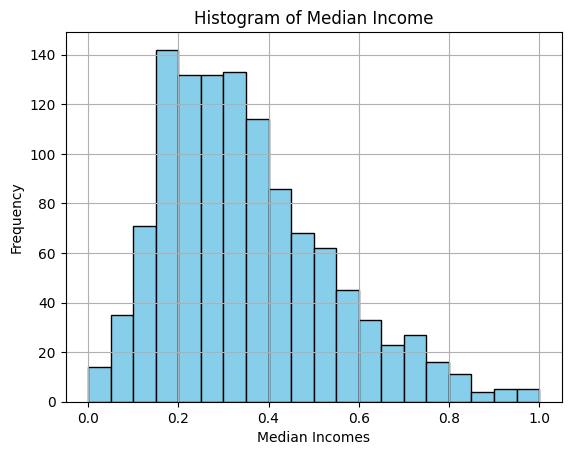

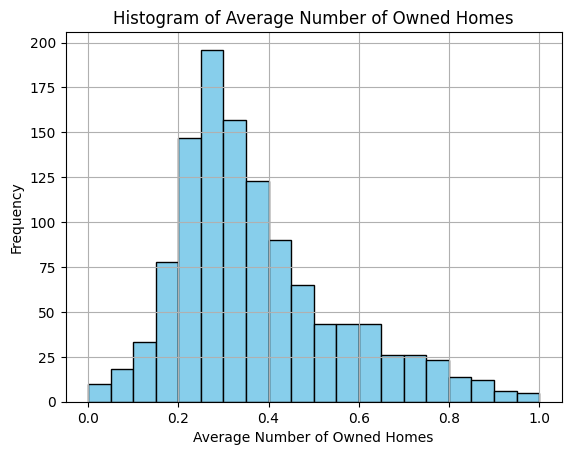

In [10]:
# Creating histograms for 2 predictors with highest correclation coefficients
plt.hist(scaled_df['Med_Income'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Median Incomes')
plt.ylabel('Frequency')
plt.title('Histogram of Median Income')
plt.grid(True)
plt.show()

plt.hist(scaled_df['Avg_OwnedHH'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Average Number of Owned Homes')
plt.ylabel('Frequency')
plt.title('Histogram of Average Number of Owned Homes')
plt.grid(True)
plt.show()

Median Income ('Med_Income') and Average Number of Owned Homes ('Avg_OwnedHH') were the two variables with the highest corellation coefficients (0.90 and 0.82 respectively). 

These two variables are relatively normally distributed - however both have a slight positive skew that can be amended.

## 4. Feature Engineering

### I. Data Transformation

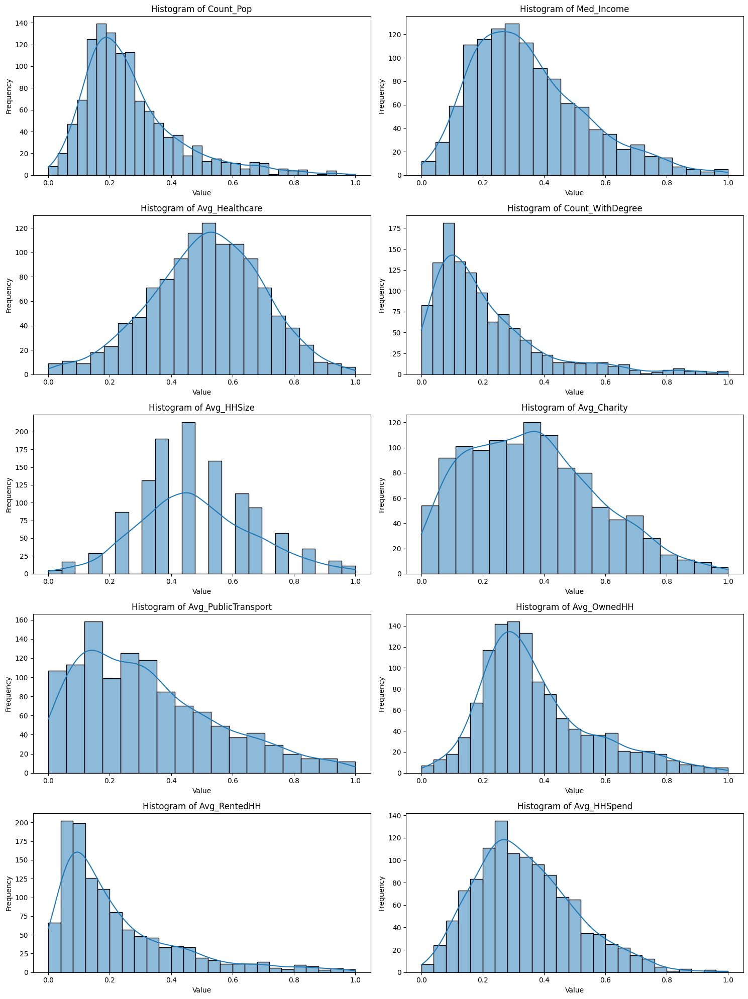

In [11]:
# Visualizing the distribution of each variable
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
axes = axes.flatten()

for i, var in enumerate(scaled_df):  
    ax = axes[i]
    sns.histplot(data=scaled_df, x=var, ax=ax, kde=True) 
    ax.set_title(f'Histogram of {var}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
plt.tight_layout()
plt.show()

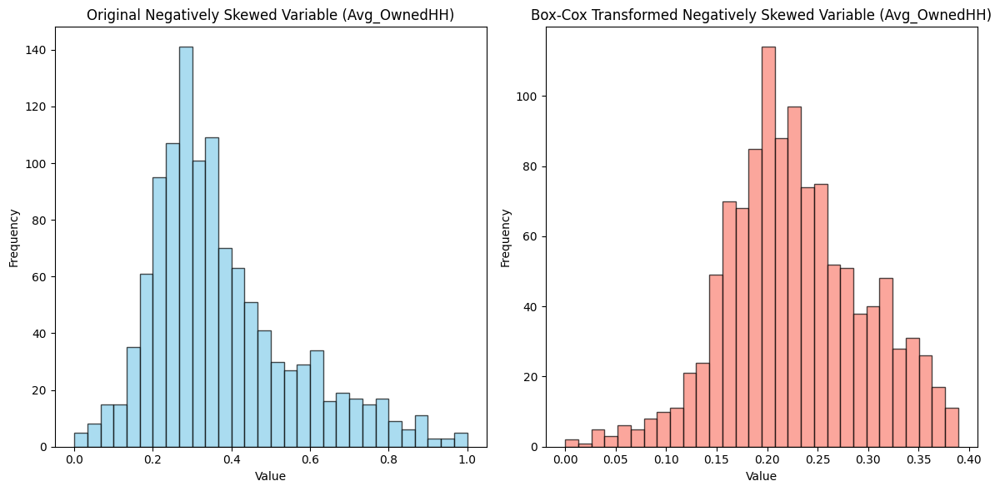

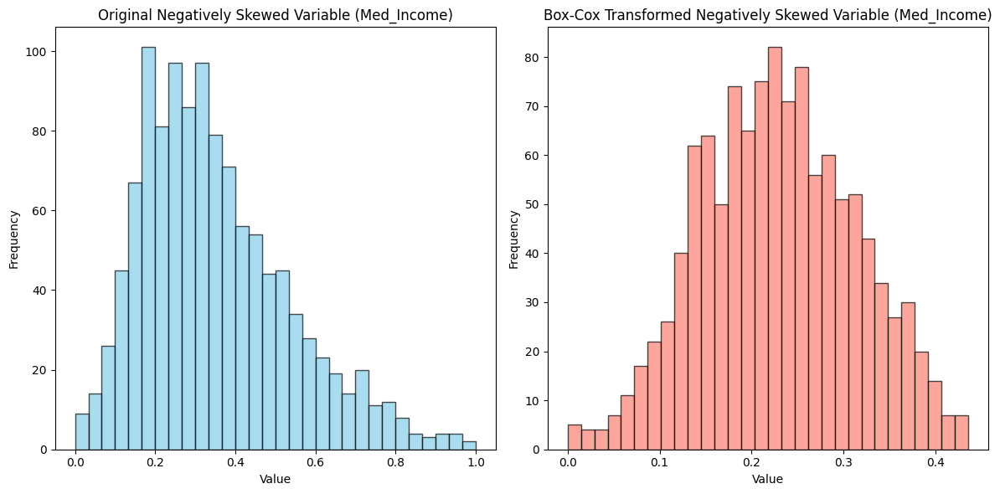

Lambda (λ) parameter for Box-Cox transformation: -0.9849344091369476


In [13]:
from scipy.stats import boxcox

# Transforming non-normally distributed data
# Adding a constant shift to make the data non-negative
constant_shift = np.abs(scaled_df.min()) + 1
data_shifted = scaled_df + constant_shift

# Applying Box-Cox transformation to each non-normally distributed variable
data_boxcox = data_shifted.copy()  
data_boxcox['Med_Income'], lambda_boxcox = boxcox(data_shifted['Med_Income'])
data_boxcox['Avg_Healthcare'], lambda_boxcox = boxcox(data_shifted['Avg_Healthcare'])
data_boxcox['Count_WithDegree'], lambda_boxcox = boxcox(data_shifted['Count_WithDegree'])
data_boxcox['Avg_HHSize'], lambda_boxcox = boxcox(data_shifted['Avg_HHSize'])
data_boxcox['Avg_Charity'], lambda_boxcox = boxcox(data_shifted['Avg_Charity'])
data_boxcox['Avg_PublicTransport'], lambda_boxcox = boxcox(data_shifted['Avg_PublicTransport'])
data_boxcox['Avg_OwnedHH'], lambda_boxcox = boxcox(data_shifted['Avg_OwnedHH'])
data_boxcox['Avg_RentedHH'], lambda_boxcox = boxcox(data_shifted['Avg_RentedHH'])
data_boxcox['Avg_HHSpend'], lambda_boxcox = boxcox(data_shifted['Avg_HHSpend'])

# Create a figure with two subplots to plot histograms of original versus BoxCox transformed variables
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(scaled_df['Avg_OwnedHH'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Original Negatively Skewed Variable (Avg_OwnedHH)')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(data_boxcox['Avg_OwnedHH'], bins=30, color='salmon', edgecolor='black', alpha=0.7)
plt.title('Box-Cox Transformed Negatively Skewed Variable (Avg_OwnedHH)')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(scaled_df['Med_Income'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Original Negatively Skewed Variable (Med_Income)')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(data_boxcox['Med_Income'], bins=30, color='salmon', edgecolor='black', alpha=0.7)
plt.title('Box-Cox Transformed Negatively Skewed Variable (Med_Income)')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Displaying the lambda parameter for Box-Cox transformation
print("Lambda (λ) parameter for Box-Cox transformation:", lambda_boxcox)

I chose the Box-Cox method to address the non-normal distributions in the data rather than a logarithmic or square root transformation as it has a greater ability to accomodate a broader spectrum of data distributions and shapes. It normalizes the data and controls variance, improving model performance and interpretability. Further, the Lambda parameter is estimated directly from the data itself, rather than being predetermined or assumed based on theoritical considerations and enables it to be more tailored to the data's characteristics.

I decided to still include the work I did with Principle Component Analysis (commented out), however it did not work out in the end. Unfortunately, I was unable to produce any linear relationships from the PCA variables to the target variable. This leads me to believe either my dataset does not benefit from PCA (which I assumed it would have considering the previous signs of multicollinearity potential and a somewhat high dimensionality), or it was a garbage-in, garbage-out situation (more likely).

Below are the steps I took to try PCA, and are not intended to be run.

In [14]:
### Reducing Dimensionality through PCA ###
# Assuming 'df_augmented_poly3' is your DataFrame after polynomial feature augmentation with degree=3

##from sklearn.decomposition import PCA

# Create a copy of df_augmented
##boxcox_copy = data_boxcox.copy()

# Define the PCA transformer to keep 95% of the variance
##target = boxcox_copy['Avg_HHSpend']

##pca = PCA(n_components=0.97)

# Select the features (excluding 'Income_Med')
##features = boxcox_copy.drop(columns=['Avg_HHSpend'])

# Fit and transform the features to reduce dimensions
##X_pca = pca.fit_transform(features)

# Create a DataFrame from the PCA results
##boxcox_pca = pd.DataFrame(X_pca, columns=[f'pca_{i}' for i in range(X_pca.shape[1])])

# Concatenate the original 'Income_Med' column with the new PCA features DataFrame
##boxcox_pca = pd.concat([boxcox_copy[['Avg_HHSpend']], boxcox_pca], axis=1)

# Print a preview of the PCA augmented DataFrame
##print(boxcox_pca.head())

# Print dimensions of the new DataFrame
##print("Dimensions of the new DataFrame:", boxcox_pca.shape)


   Avg_HHSpend     pca_0     pca_1     pca_2     pca_3     pca_4     pca_5
0     0.245355  0.506955  0.085330  0.565962  0.430595  0.334024  0.331857
1     0.238468  0.490087  0.211104  0.651533  0.348498  0.354244  0.308286
2     0.067016  0.192841  0.233866  0.515434  0.424171  0.386514  0.471397
3     0.114635  0.230600  0.246366  0.340053  0.339033  0.344445  0.434496
4     0.253678  0.515717  0.148789  0.626828  0.368475  0.365152  0.202819
Dimensions of the new DataFrame: (1158, 7)
   Avg_HHSpend     pca_0     pca_1     pca_2     pca_3     pca_4     pca_5
1     0.238468  0.490087  0.211104  0.651533  0.348498  0.354244  0.308286
3     0.114635  0.230600  0.246366  0.340053  0.339033  0.344445  0.434496
4     0.253678  0.515717  0.148789  0.626828  0.368475  0.365152  0.202819
5     0.111675  0.378139  0.173181  0.536325  0.470134  0.376159  0.246182
8     0.145708  0.310311  0.105767  0.542248  0.354373  0.356457  0.197892


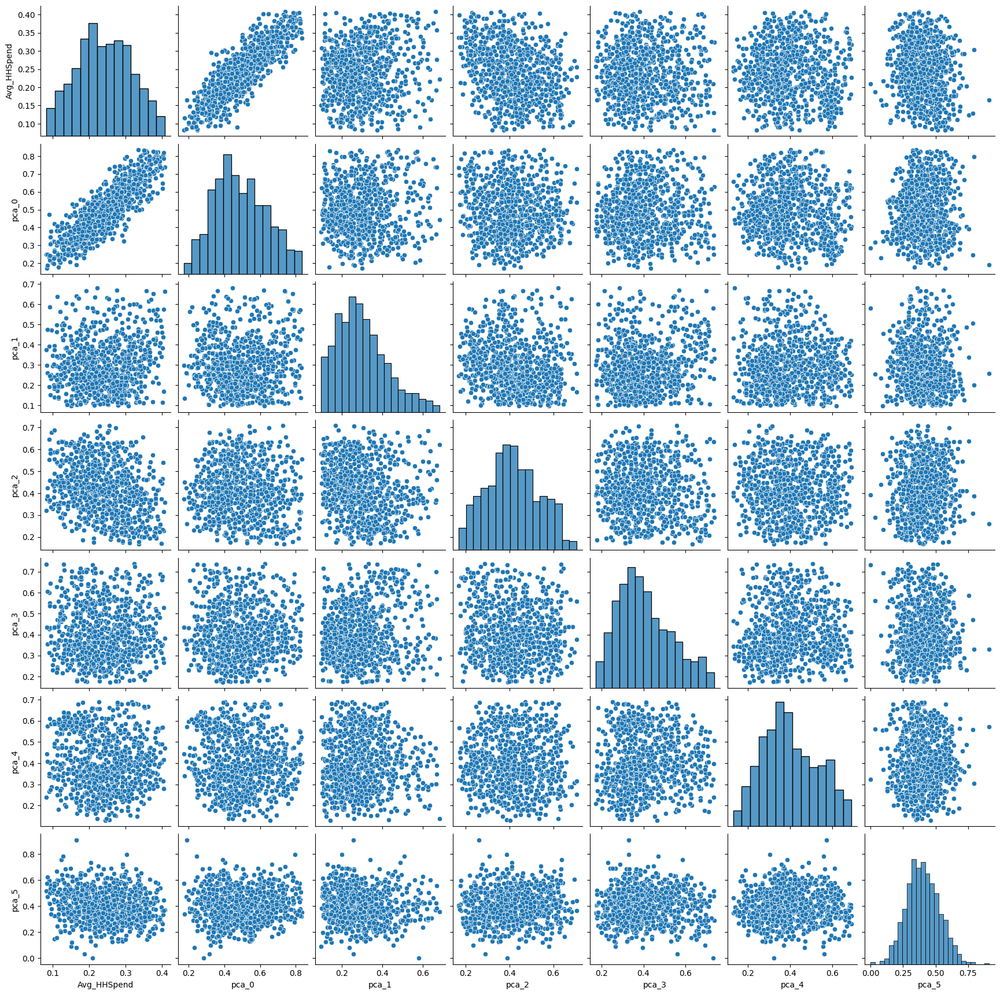

In [ ]:
##from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
##scaler = MinMaxScaler()

# Rescale df_augmented_pca
# Separate features and target variable for scaling
##features_pca = boxcox_pca.drop(columns=['Avg_HHSpend'])
##scaled_features_pca = scaler.fit_transform(features_pca)

# Create a DataFrame for the scaled features
##df_pca_scaled = pd.DataFrame(scaled_features_pca, columns=features_pca.columns)

# Add the target variable 'Avg_HHSpend' back to the scaled DataFrame
##df_pca_scaled = pd.concat([boxcox_pca[['Avg_HHSpend']].reset_index(drop=True), df_pca_scaled], axis=1)

# Print a preview of the scaled DataFrame
##print(df_pca_scaled.head())

# Print dimensions of the new DataFrame
##print("Dimensions of the new DataFrame:", df_pca_scaled.shape)


# Specify the percentiles for trimming outliers
##lower_percentile = 3
##upper_percentile = 97

# Calculate the lower and upper percentile values for each predictor
##lower_percentile_values = df_pca_scaled.iloc[:, :-1].apply(lambda x: np.percentile(x.dropna(), lower_percentile))
##upper_percentile_values = df_pca_scaled.iloc[:, :-1].apply(lambda x: np.percentile(x.dropna(), upper_percentile))

# Make a copy of df_pca_scaled
##df_pca_scaled_copy = df_pca_scaled.copy()

# Identify rows containing outliers and drop them entirely from the dataset
##for col in lower_percentile_values.index:
    ##is_outlier_lower = df_pca_scaled_copy[col] < lower_percentile_values[col]
    ##is_outlier_upper = df_pca_scaled_copy[col] > upper_percentile_values[col]
    ##outliers_index = is_outlier_lower | is_outlier_upper
    ##df_pca_scaled_copy = df_pca_scaled_copy[~outliers_index]

# Print the head of the DataFrame
##print(df_pca_scaled_copy.head())

# Plot the pairplot using df_pca_scaled_copy
##sns.pairplot(df_pca_scaled_copy, vars=['Avg_HHSpend', 'pca_0', 'pca_1', 'pca_2', 'pca_3', 'pca_4', 'pca_5'])
##plt.show()

### II. Data Augmentation

In [15]:
from sklearn.preprocessing import PolynomialFeatures
import pandas as pd

# Defining the polynomial features transformer
poly = PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)

# Selecting the predictor variables (excluding the target variable 'Avg_HHSpend')
predictors = data_boxcox.drop(columns=['Avg_HHSpend'])

# Fitting and transforming the predictors to create polynomial features
X_poly = poly.fit_transform(predictors)

# Generating the new feature names based on the polynomial features created
feature_names = poly.get_feature_names_out(predictors.columns)

# Creating a DataFrame from the polynomial features
X_poly_df = pd.DataFrame(X_poly, columns=feature_names)

# Concatenating the original 'Income_Med' column with the new polynomial features DataFrame
df_augmented = pd.concat([data_boxcox[['Avg_HHSpend']], X_poly_df], axis=1)


print(df_augmented.head())
print("Dimensions of the new DataFrame:", df_augmented.shape)

   Avg_HHSpend  Count_Pop  Med_Income  Avg_Healthcare  Count_WithDegree  \
0     0.245355   1.128697    0.234801        0.734340          0.004385   
1     0.238468   1.277378    0.212246        0.696363          0.091976   
2     0.067016   1.134293    0.038216        0.300679          0.140352   
3     0.114635   1.126299    0.112737        0.260742          0.020985   
4     0.253678   1.213429    0.224238        0.737074          0.099198   

   Avg_HHSize  Avg_Charity  Avg_PublicTransport  Avg_OwnedHH  Avg_RentedHH  \
0    0.274015     0.265613             0.065011     0.176884      0.071548   
1    0.274015     0.212227             0.050521     0.171489      0.088993   
2    0.211074     0.089373             0.074654     0.118735      0.155344   
3    0.333911     0.146279             0.103431     0.190466      0.123269   
4    0.274015     0.224502             0.050196     0.206762      0.036887   

   ...  Avg_Charity^2  Avg_Charity Avg_PublicTransport  \
0  ...       0.070550 

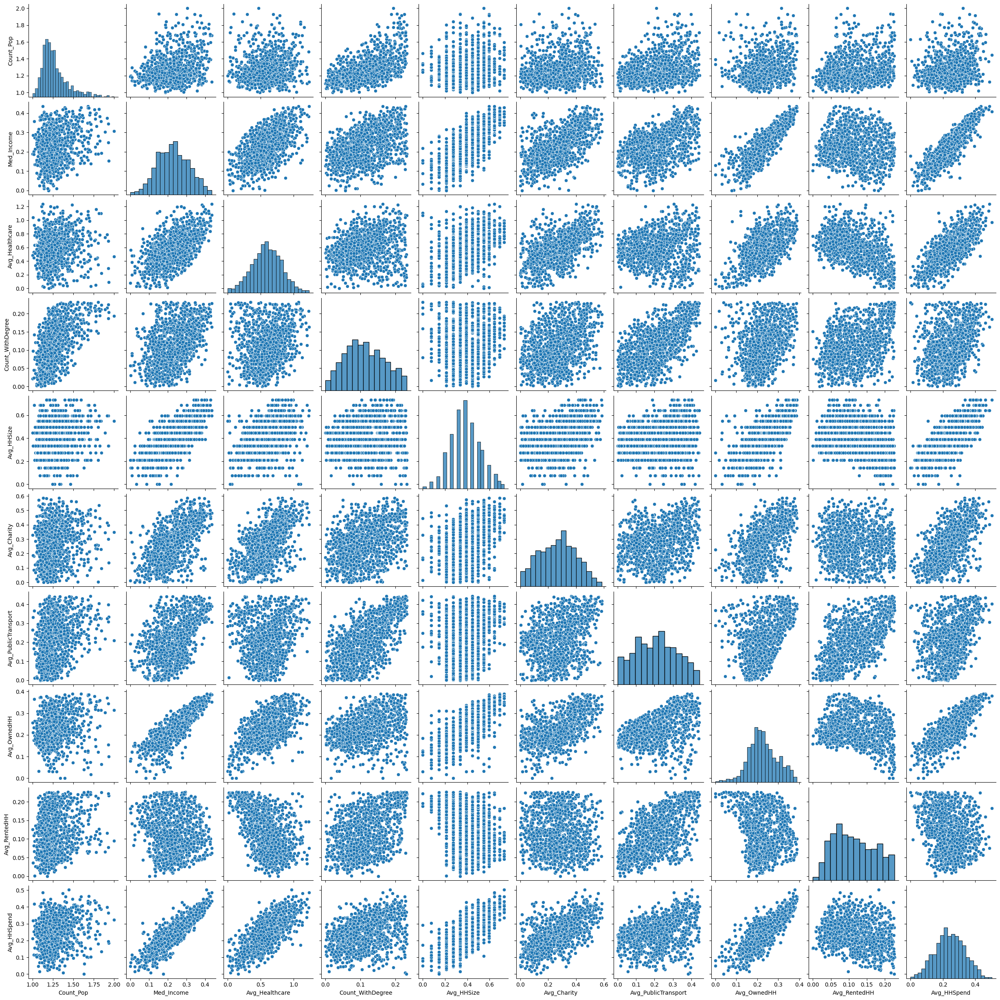

,Avg_HHSpend,Count_Pop,Med_Income,Avg_Healthcare,Count_WithDegree,Avg_HHSize,Avg_Charity,Avg_PublicTransport,Avg_OwnedHH,Avg_RentedHH,...,Avg_Charity^2,Avg_Charity Avg_PublicTransport,Avg_Charity Avg_OwnedHH,Avg_Charity Avg_RentedHH,Avg_PublicTransport^2,Avg_PublicTransport Avg_OwnedHH,Avg_PublicTransport Avg_RentedHH,Avg_OwnedHH^2,Avg_OwnedHH Avg_RentedHH,Avg_RentedHH^2
0,0.245355,1.128697,0.234801,0.734340,0.004385,0.274015,0.265613,0.065011,0.176884,0.071548,...,0.070550,0.017268,0.046983,0.019004,0.004226,0.011499,0.004651,0.031288,0.012656,0.005119
1,0.238468,1.277378,0.212246,0.696363,0.091976,0.274015,0.212227,0.050521,0.171489,0.088993,...,0.045040,0.010722,0.036395,0.018887,0.002552,0.008664,0.004496,0.029409,0.015261,0.007920
2,0.067016,1.134293,0.038216,0.300679,0.140352,0.211074,0.089373,0.074654,0.118735,0.155344,...,0.007988,0.006672,0.010612,0.013884,0.005573,0.008864,0.011597,0.014098,0.018445,0.024132
3,0.114635,1.126299,0.112737,0.260742,0.020985,0.333911,0.146279,0.103431,0.190466,0.123269,...,0.021398,0.015130,0.027861,0.018032,0.010698,0.019700,0.012750,0.036277,0.023479,0.015195
4,0.253678,1.213429,0.224238,0.737074,0.099198,0.274015,0.224502,0.050196,0.206762,0.036887,...,0.050401,0.011269,0.046418,0.008281,0.002520,0.010379,0.001852,0.042751,0.007627,0.001361


In [16]:
# Generating pairwise scatterplot matrix for all combinations of variables in the augmented df
sns.pairplot(df_augmented, vars=['Count_Pop', 'Med_Income', 'Avg_Healthcare', 'Count_WithDegree', 'Avg_HHSize', 
                                 'Avg_Charity', 'Avg_PublicTransport', 'Avg_OwnedHH', 'Avg_RentedHH', 'Avg_HHSpend'])
plt.show()

df_augmented.head()

## 5. Model Selection

### I. Describing Regression Algorithms to be Used in Model Training

Regression algorithms chosen:

1. Multiple Linear Regression:

    - Strengths: Simple and easy to interpret, provides insights into relationships between predictors and the target variable.
    - Weaknesses: Assumes a linear relationship between predictors and the target, sensitive to outliers and multicollinearity.
    - Assumptions: Assumes linearity, independence of errors, homoscedasticity (constant variance of errors), and normally distributed errors.
    - Limitations: Limited to linear relationships, may not capture complex interactions among predictors.

2. Ridge Regression:
    - Strengths: Handles multicollinearity well by adding a penalty term to the coefficients, reducing overfitting and stabilizing the model.
    - Weaknesses: Does not perform feature selection, may not effectively shrink coefficients to zero, potentially leading to biased estimates.
    - Assumptions: Similar to Multiple Linear Regression, assumes linearity and normally distributed errors.
    - Limitations: Less interpretable than Multiple Linear Regression, requires tuning of regularization parameter.

3. Lasso Regression:
    - Strengths: Performs feature selection by shrinking less important coefficients to zero, thus providing a simpler and more interpretable model.
    - Weaknesses: May not perform well with highly correlated predictors, tends to select only one variable from a group of correlated predictors.
    - Assumptions: Similar to Multiple Linear Regression and Ridge Regression.
    - Limitations: Less effective in handling multicollinearity compared to Ridge Regression.

4. Decision Trees:
    - Strengths: Can capture complex nonlinear relationships and interactions among predictors, easy to interpret and visualize.
    - Weaknesses: Prone to overfitting, sensitive to small variations in the data, lack of robustness to noise and outliers.
    - Assumptions: Minimal assumptions about the underlying data distribution.
    - Limitations: Unconstrained trees can grow excessively large, leading to overfitting and poor generalization.

5. Random Forest:
    - Strengths: Reduces overfitting compared to individual decision trees by averaging predictions from multiple trees, handles large datasets with high dimensionality well.
    - Weaknesses: Less interpretable than individual decision trees, may require more computational resources and time for training.
    - Assumptions: Similar to Decision Trees, minimal assumptions about data distribution.
    - Limitations: Random Forest may not perform well with highly imbalanced datasets or datasets with noisy features.

---

Why these regression algorithms were chosen:
-  One common theme among them is their flexibility in capturing different types of relationships between predictors and the target variable. Multiple Linear Regression, Ridge Regression, and Lasso Regression are suitable for scenarios where linear relationships are assumed or desired, while Decision Trees and Random Forest excel at capturing nonlinear relationships and interactions among predictors. Additionally, Ridge Regression and Lasso Regression offer regularization techniques to address multicollinearity and overfitting issues, making them suitable for datasets with highly correlated predictors. Decision Trees and Random Forest are preferred for their ability to handle large datasets with high dimensionality and complex decision boundaries.

---

### II. Selecting Most Suitable Regression Algorithms

From the regression algorithms specified above, I decided to keep only Multiple Linear Regression, Ridge Regression and Random Forest - excluding Lasso Regression and Decision Trees. I did this because I was trying to strike a balance betwewn simplicity, interpretability and predictive performance. Multiple Linear Regression is favored for its simplicity and interpretability, Ridge Regression for its ability to deal with multicollinearity, and Random Trees for its ability to capture complex nonlinear relationships. These three algorithms cover a broad spectrum of modeling needs while effectively addressing challenges encountered in the analysis.

## Model Training
### I. Creating Training/Testing Sets Using 80/20 Split

In [17]:
from sklearn.model_selection import train_test_split

# Separate the target variable and predictors
X = df_augmented.drop(columns=['Avg_HHSpend'])
y = df_augmented['Avg_HHSpend']

# Create train/test splits with an 80/20 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### II. & III. Training the Regression Models and Tuning Hyperparameters using Grid Search Where Applicable

RMSE (Multiple Linear Regression): 0.027273204991659736
Multiple Linear Regression Model Evaluation:
Train R^2 Score: 0.8968774836532961
Test R^2 Score: 0.8955442048407094


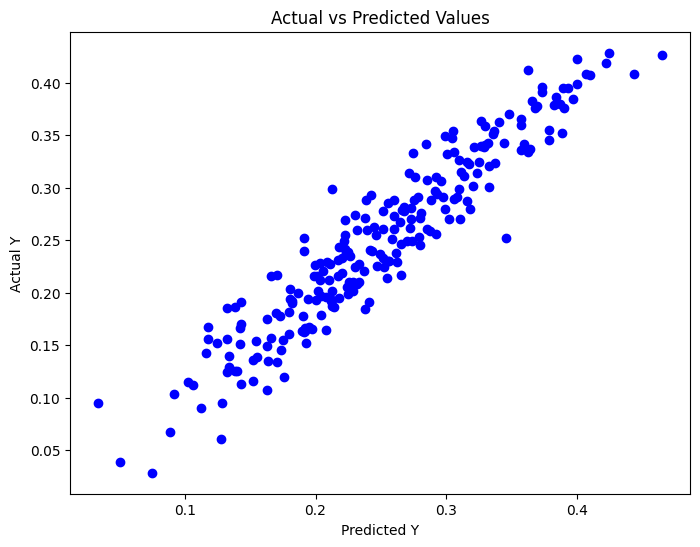

In [18]:
# Fitting Multiple Linear Regression Model

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


# Initializing the Linear Regression model
multi_model = LinearRegression()

# Fitting the model to the training data
multi_model.fit(X_train, y_train)

# Predicting on the test set
y_pred_multi = multi_model.predict(X_test)

# Calculating RMSE
rmse_multi = np.sqrt(mean_squared_error(y_test, y_pred_multi))
print("RMSE (Multiple Linear Regression):", rmse_multi)

# Evaluating the Multiple Linear Regression model
train_score_multi = multi_model.score(X_train, y_train)
test_score_multi = multi_model.score(X_test, y_test)

print("Multiple Linear Regression Model Evaluation:") 
print("Train R^2 Score:", train_score_multi) 
print("Test R^2 Score:", test_score_multi) 

# Plotting actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_pred_multi, y_test, color='blue')
plt.title('Actual vs Predicted Values')
plt.xlabel('Predicted Y')
plt.ylabel('Actual Y')
plt.show()

In [19]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge

# Defining the hyperparameter grid for Ridge Regression
param_grid_ridge = {'alpha': [0.1, 1.0, 10.0]} 

# Initializing the Ridge Regression model
ridge_model = Ridge()

# Performing Grid Search with cross-validation
grid_search_ridge = GridSearchCV(ridge_model, param_grid_ridge, cv=5, scoring='neg_mean_squared_error', verbose=1)
grid_search_ridge.fit(X_train, y_train)

# Getting the best estimator and best parameters
best_estimator_ridge = grid_search_ridge.best_estimator_
best_params_ridge = grid_search_ridge.best_params_

# Predicting on the test set using the best estimator
y_pred_ridge = best_estimator_ridge.predict(X_test)

# Calculating RMSE
rmse_ridge = np.sqrt(mean_squared_error(y_test, y_pred_ridge))
print("RMSE (Ridge Regression):", rmse_ridge)

# Evaluating the Ridge Regression model
train_score_ridge = best_estimator_ridge.score(X_train, y_train)
test_score_ridge = best_estimator_ridge.score(X_test, y_test)

print("Ridge Regression Model Evaluation:")
print("Train R^2 Score:", train_score_ridge)
print("Test R^2 Score:", test_score_ridge)

print("Corresponding hyperparameter values:")
for param, value in best_params_ridge.items():
    print(param, ":", value)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
RMSE (Ridge Regression): 0.02679631392980322
Ridge Regression Model Evaluation:
Train R^2 Score: 0.8793997132394585
Test R^2 Score: 0.8991652327665591
Corresponding hyperparameter values:
alpha : 0.1


In [20]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

# Defining the hyperparameter grid for Random Forest
param_grid_rf = {
    'n_estimators': [100, 200, 300],  # Adjust the range as needed
    'max_depth': [None, 10, 20]  # Adjust the range as needed
}

# Initializing the Random Forest Regressor
random_forest = RandomForestRegressor(random_state=42)

# Performing Grid Search with cross-validation
grid_search_rf = GridSearchCV(random_forest, param_grid_rf, cv=5, scoring='neg_mean_squared_error', verbose=1)
grid_search_rf.fit(X_train, y_train)

# Getting the best estimator and best parameters
best_estimator_rf = grid_search_rf.best_estimator_
best_params_rf = grid_search_rf.best_params_

# Predictting on the test set using the best estimator
y_pred_rf = best_estimator_rf.predict(X_test)

# Calculating RMSE
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
print("RMSE (Random Forest):", rmse_rf)

# Evaluating the Random Forest model
train_score_rf = best_estimator_rf.score(X_train, y_train)
test_score_rf = best_estimator_rf.score(X_test, y_test)

print("Random Forest Model Evaluation:")
print("Train R^2 Score:", train_score_rf)
print("Test R^2 Score:", test_score_rf)

print("Corresponding hyperparameter values:")
for param, value in best_params_rf.items():
    print(param, ":", value)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
RMSE (Random Forest): 0.027106760827238428
Random Forest Model Evaluation:
Train R^2 Score: 0.9775313858701083
Test R^2 Score: 0.8968152696338246
Corresponding hyperparameter values:
max_depth : 10
n_estimators : 300


I chose the Grid Search hyperparameter tuner over other options when running the Ridge and Random Forest regression algorithms as it searches through a predefined grid of hyperparameter values, evaluating each combination which guarantees that the optimal hyperparameters within the specific grid are found.

## 7. Model Evaluation
### I. Compute & Store RMSE Values, Creating Bar Plot that Compares Each Model

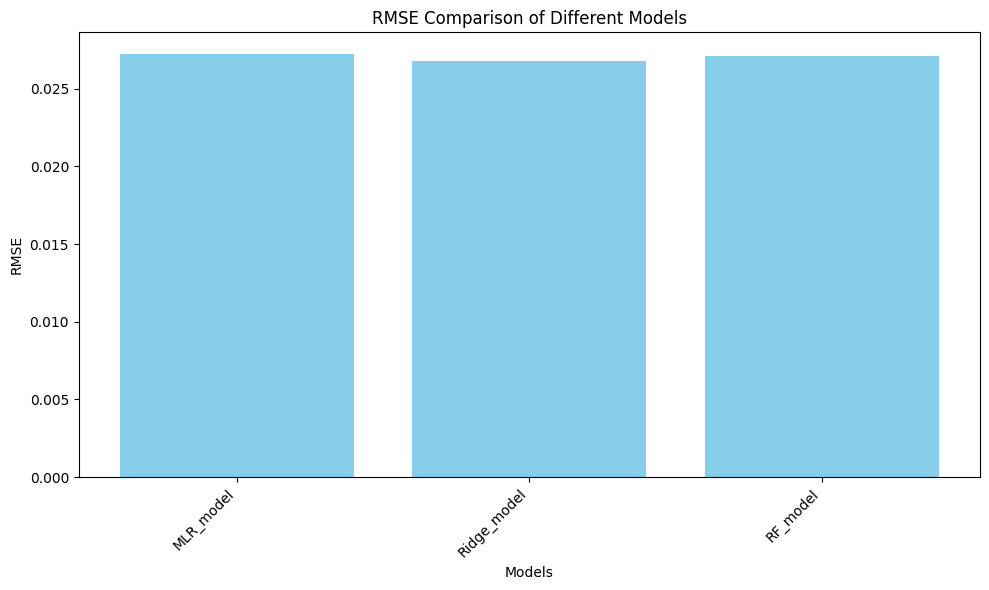

In [21]:
import matplotlib.pyplot as plt

# Creating dictionary containing model names as keys and corresponding RMSE values as values
rmse_values = {
    'MLR_model': 0.027273204991659736,
    'Ridge_model': 0.02679631392980322,
    'RF_model' : 0.027106760827238428
}

# Extracting model names and RMSE values
models = list(rmse_values.keys())
rmse_scores = list(rmse_values.values())

# Creating a bar plot from RMSE values
plt.figure(figsize=(10, 6))
plt.bar(models, rmse_scores, color='skyblue')
plt.xlabel('Models')
plt.ylabel('RMSE')
plt.title('RMSE Comparison of Different Models')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

### II. Selecting the Best Performing Model
The Ridge Regression model is the best performing with a RMSE value that is only 0.00048 greater than that of Multiple Linear Regression in second place. The three models each preformed very well, and nearly equally well. 

The Ridge Regression model achieved accurate predictions with minimal error, indicating strong predictive perfomance and generalization capability. The training R^2 score highlights the model's ability to capture the variability in the training data, and the test R^2 score demonstrates its effectiveness in making accurate predictions on unseen data, indicating robustness and reliability.

## 8. Interpretation and Discussion
Does your model perform better or worse than expected?
- My model honestly performed better than expected. I was very concerned about some of my predictors being potentially dependent variables themselves but if they were it did not seem to impact the analysis all too much. However, this could be something to look to if trying to improve model in the future.

Based on your domain knowledge, is this model worth deploying?
- As it stands right now, I do not believe this model is worth deploying. I believe there would need to be a greater delve into the predictor variables - perhaps switching a few out - and issues of interpretability. However, I believe there are real-world implications for theoretical future versions of this regression project, especially when considering the high data quality and stability.

What needs to be improved in order to increase model performance?
- As mentioned above, potentially looking into predictor variable independence and data complexity.
- Further playing around with potential multicollinearity and removing predictors with high correlation coefficents - perhaps I should have tried removing 'Avg_OwnedHH' or 'Avg_Size_HH' instead as these had slightly lower linear relationships to the target variable.
- Interpretability - some is lost in the scaling and transforming of the data, which could potentially be amended through the use of different methods.
- Reconfiguring hyperparameter tuning to further explore model optimization.

Did hyperparameter tuning lead to better or worse model performance? Explain your answer.
- After going in and applying the hyperparameter tuning, both the RMSE scores for Multiple Linear Regression and Random Forest were unaffected, however the RMSE for Ridge Regression dropped ever so slightly. Because all of the models' RMSE values were so close together, this moved Ridge Regression just above to just below Random Forest, which beforehand was the best performing model. Meaning, the hyperparameter tuning ensured that Ridge Regression performed best rather than Random Forest.